<a href="https://colab.research.google.com/github/navroz-lamba/DS-Unit-2-Applied-Modeling/blob/master/airbnb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import 
source: http://insideairbnb.com/get-the-data.html

Using NLP i 

## importing all the libraries  

In [ ]:
# importing all the libraries 

import pandas as pd
import numpy as np
import random
import sklearn

# libraries for plots
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
import shap
import pdpbox
from pdpbox.pdp import pdp_interact, pdp_interact_plot
from pdpbox.pdp import pdp_isolate, pdp_plot
import plotly.express as px
from wordcloud import WordCloud, ImageColorGenerator

# Natural Language Processing 
import nltk
from nltk import sent_tokenize, word_tokenize
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer 
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

# to split the dataset into test and train 
from sklearn.model_selection import StratifiedShuffleSplit

# Transformers for the Pipeline
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
import category_encoders as ce
from category_encoders import OrdinalEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

# Evaluation metrics
from sklearn.metrics import mean_absolute_error

# Cross Validation libraries
from sklearn.model_selection import cross_val_score, RandomizedSearchCV

# Predictors 
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, VotingRegressor
from sklearn.svm import LinearSVR

# feature Importances 
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.inspection import permutation_importance

# For deployment 
import joblib           # pickle the pipeline
from joblib import dump

## importing the dataset from the source

In [ ]:
# to view all the columns in the head 
pd.set_option('display.max_columns', None)

# parse host_since, first_review, last_review and calendar_last_scraped
df = pd.read_csv('listings.csv',
                parse_dates=['first_review', 'last_review', 'host_since', 'calendar_last_scraped'])
df.head(25)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,109,https://www.airbnb.com/rooms/109,20200610033538,2020-06-11,Amazing bright elegant condo park front *UPGRA...,"*** Unit upgraded with new bamboo flooring, br...","*** Unit upgraded with new bamboo flooring, br...","*** Unit upgraded with new bamboo flooring, br...",none,NaN,NaN,NaN,NaN,NaN,Camelot NEW RESIDENTS’ GENERAL INFORMATION F...,NaN,NaN,https://a0.muscache.com/im/pictures/4321499/1d...,NaN,521,https://www.airbnb.com/users/show/521,Paolo,2008-06-27,"San Francisco, California, United States",Search for me on the Internet with the keyword...,NaN,NaN,0%,f,https://a0.muscache.com/im/users/521/profile_p...,https://a0.muscache.com/im/users/521/profile_p...,Culver City,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"Culver City, CA, United States",Culver City,Culver City,Other Cities,Culver City,CA,90230,Los Angeles,"Culver City, CA",US,United States,33.98209,-118.38494,t,Condominium,Entire home/apt,6,2.0,2.0,3.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,$122.00,$904.00,"$2,851.00",$500.00,$240.00,3,$25.00,30,730,30,30,730,730,30.0,730.0,4 months ago,t,0,0,0,71,2020-06-11,2,0,2011-08-15,2016-05-15,80.0,10.0,10.0,6.0,8.0,10.0,8.0,f,NaN,"{""Culver City"","" CA""}",f,f,strict_14_with_grace_period,t,f,1,1,0,0,0.02
1,344,https://www.airbnb.com/rooms/344,20200610033538,2020-06-12,Family perfect;Pool;Near Studios!,This home is perfect for families; aspiring ch...,"Cheerful & comfortable; near studios, amusemen...",This home is perfect for families; aspiring ch...,none,Quiet-yet-close to all the fun in LA! Hollywoo...,"One dog may be on premises, friendly and cared...",Short drive to subway and elevated trains runn...,"Pool, patio and self-contained main house all ...",Host and caretaker may be available throughout...,Host asks that guests refrain from partying lo...,NaN,NaN,https://a0.muscache.com/im/pictures/cc4b724d-d...,NaN,767,https://www.airbnb.com/users/show/767,Melissa,2008-07-11,"Burbank, California, United States","Single mother, CEO and Owner of an internation...",within a few hours,100%,30%,f,https://a0.muscache.com/im/users/767/profile_p...,https://a0.muscache.com/im/users/767/profile_p...,Burbank,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'kba', ...",t,t,"Burbank, CA

# EDA

In [ ]:
df.shape

(35757, 106)

In [ ]:
# percentage of values that are missing
total_nan = df.isna().sum().sort_values(ascending=False)
percentage_nan = (total_nan / df.shape[0]) * 100
tabel = pd.concat([total_nan, percentage_nan], axis=1, keys=['Total NaN values', 'Percentage of NaN values']).head(60)
tabel

,Total NaN values,Percentage of NaN values
thumbnail_url,35757,100.000000
medium_url,35757,100.000000
xl_picture_url,35757,100.000000
square_feet,35524,99.348379
monthly_price,32540,91.003160
weekly_price,32308,90.354336
license,26739,74.779763
notes,18197,50.890735
access,15497,43.339766
transit,14050,39.293006


Notes: potential drops

- Looking at the percentage of NaN values above it is clear that we can drop thumbnail_url, medium_url, xl_picture_url, square_feet, monthly_price, weekly_price, license, notes can be dropped.

- summary, space, description tell the same thing. Drop summary, space, name.

- Since we are looking for airbnb in Los Angeles state, country, country_code are unique and can be dropped. 

- review_scores_cleanliness and review_scores_accuracy tells us the same thing and one of them can be dropped.

host_identity_verified and host_has_profile_pic are unique and add no value to out model. 

- listing_url, scrape_id, last_scraped, experiences_offered, transit, access, interaction, house_rules,	picture_url, host_url, host_about, host_thumbnail_url, host_picture_url and host_verifications can be dropped.

- host_listings_count, host_total_listings_count tells the same thing. host_total_listings_count can be dropped



In [ ]:
# lets drop what we can and then further look into the features 
# making a list of all the columns to be dropped 
drop_cols = ['summary', 'space', 'name', 'state', 'country', 'country_code', 'review_scores_cleanliness', 'review_scores_accuracy',
            'listing_url', 'scrape_id', 'last_scraped', 'experiences_offered', 'notes', 'transit', 'access', 'interaction', 'house_rules', 
            'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_url', 'host_about', 'host_thumbnail_url', 'host_picture_url',
            'host_verifications', 'monthly_price', 'weekly_price', 'host_total_listings_count', 'calendar_updated', 'square_feet', 'host_identity_verified',
            'host_has_profile_pic']
# making a new dataframe 
airbnb = df.drop(drop_cols, axis=1)
airbnb.shape 

(35757, 73)

Notes: Attributes that need to be further looked into before we delete more features 

- host_location, host_neighbourhood, street, neighborhood, neighborhood_cleansed,  neighbourhood_group_cleansed, smart_location, market, city, jurisdiction name tell us the same thing and needs to be further looked into.

- calculated_host_listings_count_shared_rooms seems to have all zeros and needs to be further looked into 

- minimum_nights, maximum_nights, minimum_minimum_nights, maximum_minimum_nights, minimum_maximum_nights, maximum_maximum_nights	minimum_nights_avg_ntm, maximum_nights_avg_ntm seems to have the same information and needs to be further looked into

- calendar_updated needs to be changed to datetime and then changed to days

- host_response_rate, host_acceptance_rate has % sign that needs to be removed. 

- price	weekly_price, monthly_price, security_deposit, cleaning_fee, extra_people have dollar signs that need to be stripped.

- we could extract some important information from amenities, description, neighborhood_overview using NLP. 


In [ ]:
#lets look into the neighborhood column and see what might help us in predicting the price 
airbnb[['host_location', 'host_neighbourhood', 'street', 'neighbourhood', 'neighbourhood_cleansed',  
    'neighbourhood_group_cleansed', 'smart_location','market', 'city', 'jurisdiction_names']].head(5)

# since they all seem to be giving the same information and neighbourhood_cleansed has no NaN values we will keep that and drop everything else

,host_location,host_neighbourhood,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,smart_location,market,city,jurisdiction_names
0,"San Francisco, California, United States",Culver City,"Culver City, CA, United States",Culver City,Culver City,Other Cities,"Culver City, CA",Los Angeles,Culver City,"{""Culver City"","" CA""}"
1,"Burbank, California, United States",Burbank,"Burbank, CA, United States",Burbank,Burbank,Other Cities,"Burbank, CA",Los Angeles,Burbank,NaN
2,"Los Angeles, California, United States",Hollywood,"Los Angeles, CA, United States",Hollywood,Hollywood,City of Los Angeles,"Los Angeles, CA",Los Angeles,Los Angeles,"{""City of Los Angeles"","" CA""}"
3,"Santa Monica, California, United States",Santa Monica,"Santa Monica, CA, United States",Santa Monica,Santa Monica,Other Cities,"Santa Monica, CA",Los Angeles,Santa Monica,"{""Santa Monica"","" Santa Monica"","" CA""}"
4,"Bellflower, California, United States",Bellflower,"Bellflower, CA, United States",Bellflower,Bellflower,Other Cities,"Bellflower, CA",Los Angeles,Bellflower,NaN


In [ ]:
# calculated_host_listings_count_shared_rooms seems to have a lot zeroes which in case means the host never listed a shared room
airbnb.calculated_host_listings_count_shared_rooms.value_counts()
# we will keep that for now it might help

0     33957
1       619
4       172
2       113
3        82
23       78
67       67
5        66
10       66
19       64
26       56
11       50
6        48
15       38
8        37
37       37
7        36
28       28
12       24
22       22
14       21
17       20
20       20
9        18
18       18
Name: calculated_host_listings_count_shared_rooms, dtype: int64

In [ ]:
# minimum_nights, maximum_nights, minimum_minimum_nights, maximum_minimum_nights, minimum_maximum_nights, 
# maximum_maximum_nights, minimum_nights_avg_ntm, maximum_nights_avg_ntm 
#seems to have the same information and needs to be further looked into

airbnb[['minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 
'minimum_maximum_nights', 'maximum_maximum_nights','minimum_nights_avg_ntm', 'maximum_nights_avg_ntm']].head(15)

# looking at this we will just keep minimum_nights and maximum_night and delete the rest 

,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm
0,30,730,30,30,730,730,30.0,730.0
1,2,14,2,2,14,14,2.0,14.0
2,30,366,30,30,1125,1125,30.0,1125.0
3,1,180,1,1,180,180,1.0,180.0
4,30,730,30,30,1125,1125,30.0,1125.0
5,30,1125,1,30,1125,1125,29.9,1125.0
6,30,1125,30,30,1125,1125,30.0,1125.0
7,1,90,1,5,1125,1125,1.9,1125.0
8,5,29,5,5,1125,1125,5.0,1125.0
9,30,366,30,30,1125,1125,30.0,1125.0


In [ ]:
# another list of columns that need to be dropped
drop_cols2 = ['minimum_minimum_nights','maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights',
              'minimum_nights_avg_ntm','maximum_nights_avg_ntm','host_location', 
              'host_neighbourhood', 'street', 'neighbourhood', 'neighbourhood_group_cleansed',
              'smart_location', 'market', 'city', 'jurisdiction_names']

airbnb = airbnb.drop(drop_cols2, axis=1)
airbnb.shape # we cut down a good chunk of cols already!

(35757, 58)

In [ ]:
# lets have a look what all we have left 
airbnb.head()


,id,description,neighborhood_overview,host_id,host_name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,neighbourhood_cleansed,zipcode,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,109,"*** Unit upgraded with new bamboo flooring, br...",NaN,521,Paolo,2008-06-27,NaN,NaN,0%,f,1.0,Culver City,90230,33.98209,-118.38494,t,Condominium,Entire home/apt,6,2.0,2.0,3.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$122.00,$500.00,$240.00,3,$25.00,30,730,t,0,0,0,71,2020-06-11,2,0,2011-08-15,2016-05-15,80.0,6.0,8.0,10.0,8.0,f,NaN,f,f,strict_14_with_grace_period,t,f,1,1,0,0,0.02
1,344,This home is perfect for families; aspiring ch...,Quiet-yet-close to all the fun in LA! Hollywoo...,767,Melissa,2008-07-11,within a few hours,100%,30%,f,1.0,Burbank,91505,34.16562,-118.33458,t,House,Entire home/apt,6,1.0,3.0,3.0,Real Bed,"{Internet,Wifi,""Air conditioning"",Pool,Kitchen...",$168.00,$0.00,$100.00,6,$0.00,2,14,t,1,7,7,128,2020-06-12,8,2,2016-06-14,2019-10-19,97.0,10.0,10.0,10.0,10.0,f,NaN,t,f,flexible,f,f,1,1,0,0,0.16
2,2708,200 MBPS Highspeed Internet Highest Standard |...,We are minutes away from the Mentor Language I...,3008,Chas.,2008-09-16,within an hour,100%,100%,t,2.0,Hollywood,90046,34.09768,-118.34602,t,Apartment,Private room,1,1.5,1.0,1.0,Real Bed,"{Internet,Wifi,""Air conditioning"",""Wheelchair ...",$79.00,$450.00,$89.00,1,$0.00,30,366,t,14,44,74,349,2020-06-10,24,4,2014-06-09,2020-03-17,97.0,10.0,10.0,10.0,10.0,t,NaN,t,f,strict_14_with_grace_period,f,f,2,0,2,0,0.33
3,2732,An oasis of tranquility awaits you. This is a ...,"This is the best part of Santa Monica. Quiet, ...",3041,Yoga Priestess,2008-09-17,within an hour,100%,70%,f,2.0,Santa Monica,90405,34.00475,-118.48127,t,Apartment,Private room,1,1.0,1.0,1.0,Pull-out Sofa,"{Internet,Wifi,Kitchen,Heating,Washer,Dryer,""S...",$155.00,NaN,$100.00,1,$0.00,1,180,t,30,60,90,365,2020-06-11,21,3,2011-06-06,2019-12-27,94.0,9.0,9.0,10.0,9.0,t,228269,f,f,strict_14_with_grace_period,f,f,2,1,1,0,0.19
4,2864,Centrally located.... Furnished with King Size...,What makes the neighborhood unique is that the...,3207,Bernadine,2008-09-25,within a few hours,100%,NaN,f,1.0,Bellflower,90706,33.87619,-118.11397,t,Apartment,Entire home/apt,2,1.0,1.0,1.0,Real Bed,"{TV,Internet,Wifi,""Air conditioning"",""Free par...",$80.00,$100.00,$75.00,2,$0.00,30,730,t,0,0,0,0,2020-06-10,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,f,NaN,t,f,strict_14_with_grace_period,f,f,1,1,0,0,NaN


In [ ]:
# we could further delete the columns with high cardinality or high percentage of NaNs
drop_cols3 = ['host_id', 'host_name', 'is_location_exact', 'calendar_last_scraped', 'requires_license', 'license',
                 'is_business_travel_ready', 'require_guest_phone_verification', 'calculated_host_listings_count_entire_homes', 
                 'calculated_host_listings_count_private_rooms', 'neighborhood_overview']
airbnb = airbnb.drop(drop_cols3, axis=1)

In [ ]:
airbnb.shape # making progress. got left with 49 cols 

(35757, 47)

## using strip( ) to remove sepcial characters % and $

- host_response_rate, host_acceptance_rate has % sign that needs to be removed.

- price weekly_price, monthly_price, security_deposit, cleaning_fee, extra_people have "$" and "," that needs to be removed

In [ ]:
def wrangle(X):
    # list of columns that we need to run strip function on 
    cols1 = ['host_response_rate', 'host_acceptance_rate'] 
    cols2 = ['price', 'security_deposit', 'cleaning_fee', 'extra_people']
    # iterating over all the columns in the list 
    for col in cols1:
        X[col] = X[col].str.strip('%')
    for col in cols2:
        X[col] = X[col].str.strip('$')
    for col in cols2:
        X[col] = X[col].str.replace(',','')
    
    # list of datetime columns that we will change to weeks for feature engineering in the next step
    cols3 = ['first_review', 'last_review', 'host_since']
     # iterating over all the columns in the list
    for col in cols3:
        X[col] = X[col].dt.week
    
    # change dtype of 'price', security_deposit', 'cleaning_fee', 'extra_people' to float
    for col in cols2:
        X[col] = X[col].astype(float)
        
    return X

# passing our dataframe as the argument 
airbnb = wrangle(airbnb)

In [ ]:
# lets have a lool where stand with our null values 
total_nan = airbnb.isna().sum().sort_values(ascending=False)
percentage_nan = (total_nan / airbnb.shape[0]) * 100
tabel = pd.concat([total_nan, percentage_nan], axis=1, keys=['Total NaN values', 'Percentage of NaN values'])
tabel

,Total NaN values,Percentage of NaN values
host_response_time,10948,30.617781
host_response_rate,10948,30.617781
security_deposit,8597,24.042845
review_scores_value,7986,22.334088
review_scores_location,7982,22.322902
review_scores_checkin,7978,22.311715
review_scores_communication,7966,22.278155
review_scores_rating,7909,22.118746
reviews_per_month,7469,20.888218
last_review,7469,20.888218


## Dealing with High Cardinality attributes 

Other than `description` and `amenities` which we will be dealing under feature engineering, `neighborhood_cleansed` and `property type` are the only two left with high cardinality. 

In [ ]:
airbnb.corr()['price'].sort_values(ascending=False)


price                                          1.000000
security_deposit                               0.533584
bathrooms                                      0.460714
cleaning_fee                                   0.399433
bedrooms                                       0.395698
accommodates                                   0.344407
beds                                           0.271204
guests_included                                0.215130
extra_people                                   0.065784
availability_365                               0.060739
availability_30                                0.048005
availability_60                                0.044221
id                                             0.043524
availability_90                                0.043096
review_scores_location                         0.036803
maximum_nights                                 0.031717
host_since                                     0.030022
calculated_host_listings_count                 0

In [ ]:
# for property_type i am considering top 15 types and putting rest under Others

# list of top 15 values
top15 = airbnb['property_type'].value_counts()[:15].index
# if not in top 15 put it under 'Other'
airbnb.loc[~airbnb['property_type'].isin(top15), 'property_type'] = 'Other'

Changing the name of the vertical, `neighbourhood_cleansed`

In [ ]:
airbnb= airbnb.rename({"neighbourhood_cleansed":"neighborhood"}, axis='columns')


In [ ]:
# for property_type i am considering top 17 types and putting the rest under Others

# list of top 17 values
top17 = airbnb['neighborhood'].value_counts()[:17].index
# if not in top 17 put it under 'Other'
airbnb.loc[~airbnb['neighborhood'].isin(top17), 'neighborhood'] = 'Other'

## Data Visualization 

Since we have a lot of columns that seem interesting to look into, and to compare with our target variable, i split them into two so they are easy to visualize. 

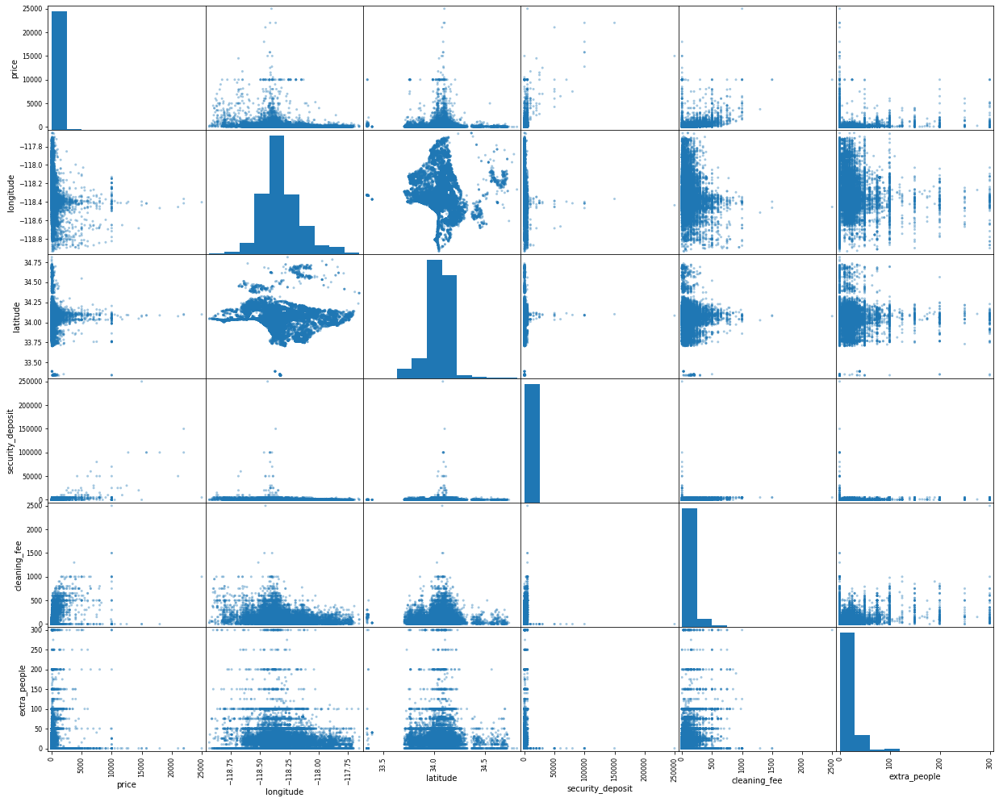

In [ ]:
cols = ['price','longitude', 'latitude', 'security_deposit', 
        'cleaning_fee', 'extra_people']


scatter_matrix(airbnb[cols], alpha=0.4, figsize=(21,17))
plt.savefig(r"figure_2.png")
plt.show()

<Figure size 3000x2000 with 0 Axes>

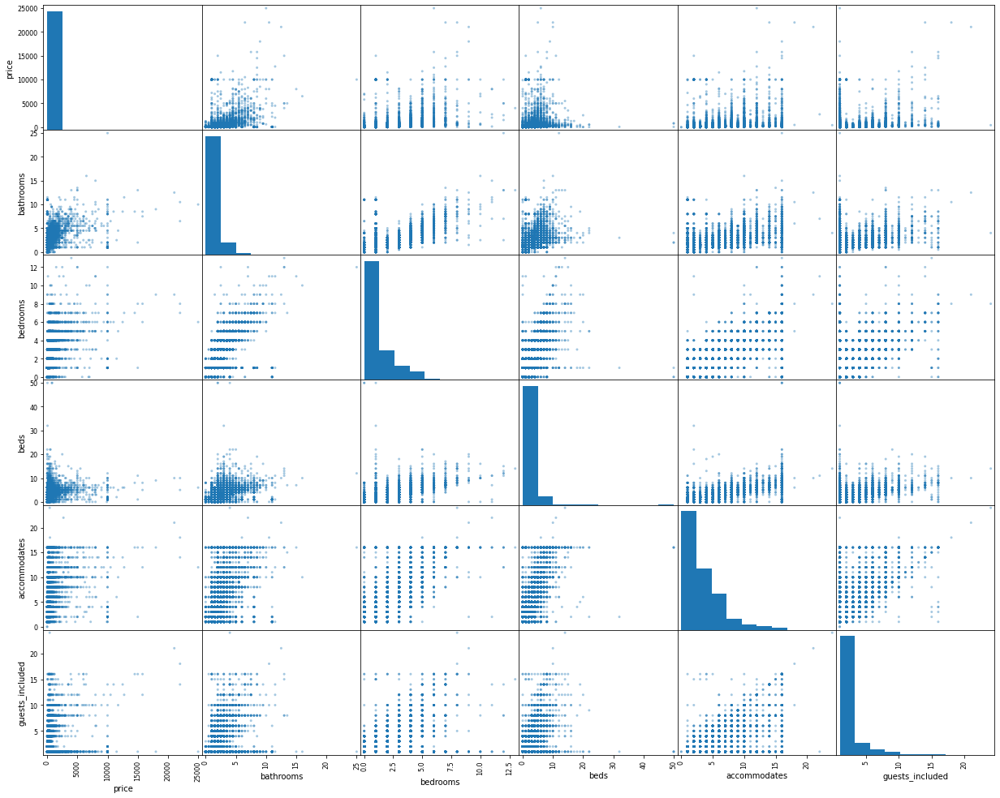

In [ ]:
# plotting the following features that seem to affect the price
cols1 = ['price','bathrooms', 'bedrooms', 
        'beds', 'accommodates', 'guests_included']

plt.figure(dpi=500, facecolor = '#dadada')

scatter_matrix(airbnb[cols1], alpha=0.4, figsize=(21,17))

plt.savefig(r"figure_1.png")
plt.show()

### Observations:
- Longitude and Latitude are the only attributes that are not badly skewed.

- Our target Vector in particular is `highly positively skewed` and needs attention.

- They all seem to have `a lot of outliers`. 

- `Security_deposit, bathrooms, cleaning_fee, beds are positively correlated with the price.` 

- `Price cap is clearly visible at 10,000`, but it shouldn't be a problem for us as we will be filtering out such expensive night stays for our model to predict well.

- There are straight lines visible in the bathroom scatter plot as well. 

## Outliers / skewness 

In [ ]:
# Finding skewness of the following attributes
cols = ['longitude', 'latitude', 'security_deposit','price', 'bathrooms', 'cleaning_fee', 'bedrooms', 'beds', 'accommodates', 'guests_included', 'extra_people']
def finding_skewness():
    for col in cols:
        print(f'{col} has a skewness of {airbnb[col].skew(skipna = True)}')

finding_skewness()

longitude has a skewness of 0.6490261432608104
latitude has a skewness of 0.1064683702077751
security_deposit has a skewness of 50.4469625963504
price has a skewness of 13.406326305089431
bathrooms has a skewness of 4.182347786522701
cleaning_fee has a skewness of 3.3424195426945102
bedrooms has a skewness of 2.0061281677332365
beds has a skewness of 4.533575082026884
accommodates has a skewness of 1.9735036385957978
guests_included has a skewness of 3.0325009009197568
extra_people has a skewness of 4.731811987297609


`Price` as our target variable with a `skewness of 13.40` it could be a huge problem.
We could do the following to fix the problem:
- we could filter out the outliers carefully looking at the box plot
- we could also take the log of price to further bring down the skewness

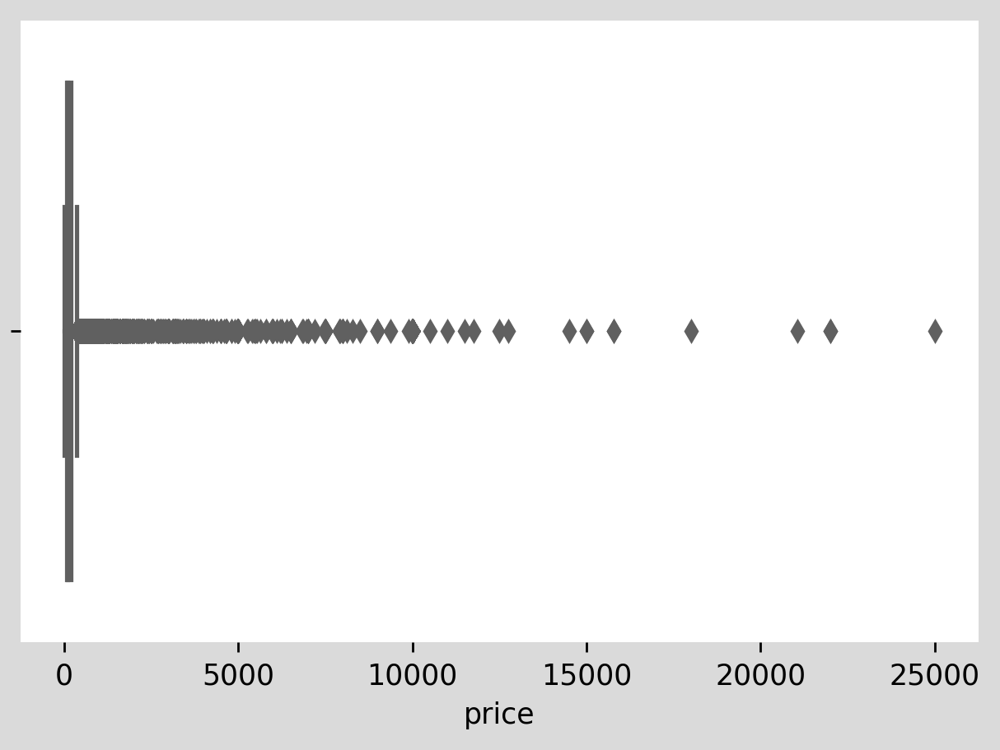

In [ ]:
# to set the facecolor
plt.figure(dpi=250, facecolor = '#dadada')

sns.boxplot('price', data=airbnb, palette='Blues')
# plt.ylim(0,5000)# Remove the splines 
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["bottom"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_visible(False)
        
plt.savefig(r"box2.png")

plt.show()

Its hard to believe that a nightly price of an airbnb would go all the way up to 25000. In short there are a lot of outliers in price that could really throw off our predictions. 

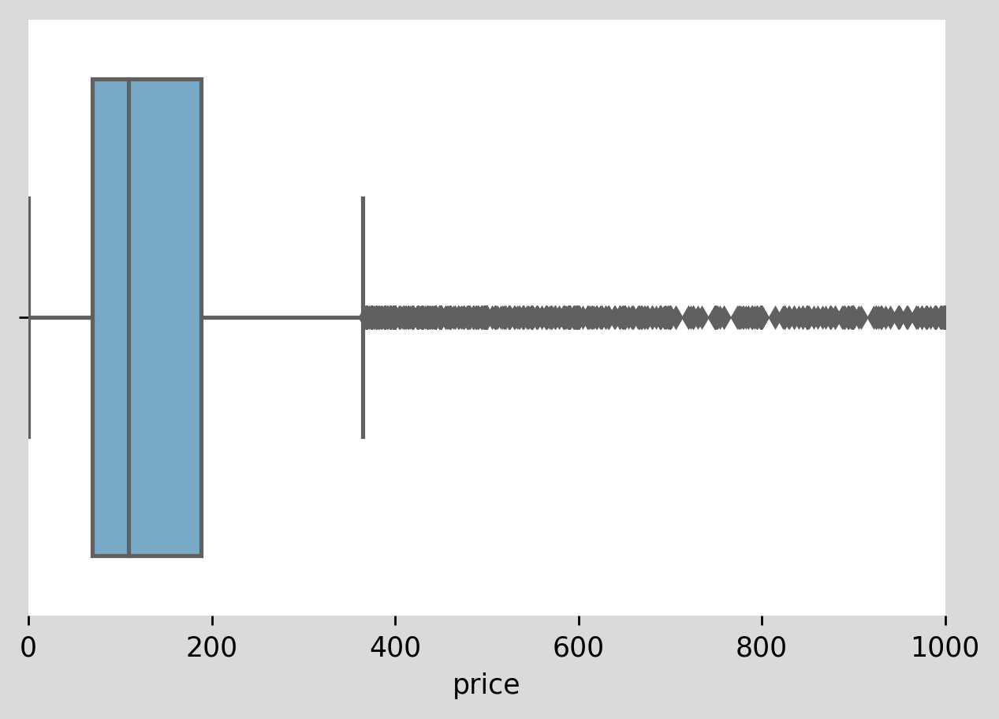

In [ ]:
plt.figure(dpi=250, facecolor = '#dadada')
# by limitting the x axis we are no able to see the box
sns.boxplot('price', data=airbnb, palette='Blues')
plt.xlim(0,1000)

# Remove the splines 
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["bottom"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_visible(False)

plt.savefig(r"box1.png")

plt.show()

Looking at the box plot `interquartile range` of airbnb nightly price is between `75 to 175`, and about 110 is the mean.  

In [ ]:
# to get rid of the outliers and to bring down the skewness we will only use price below 1000 and above 24

airbnb = airbnb.loc[(airbnb.price < 1000) & (airbnb.price > 24)]

In [ ]:
# checking how much did we control the skewness on price 
airbnb.price.skew()

2.873135209252113

- We were able to bring down the skewness of our target variable down to `2.3` from 13.4 and the rest we will take care by applying log later. 

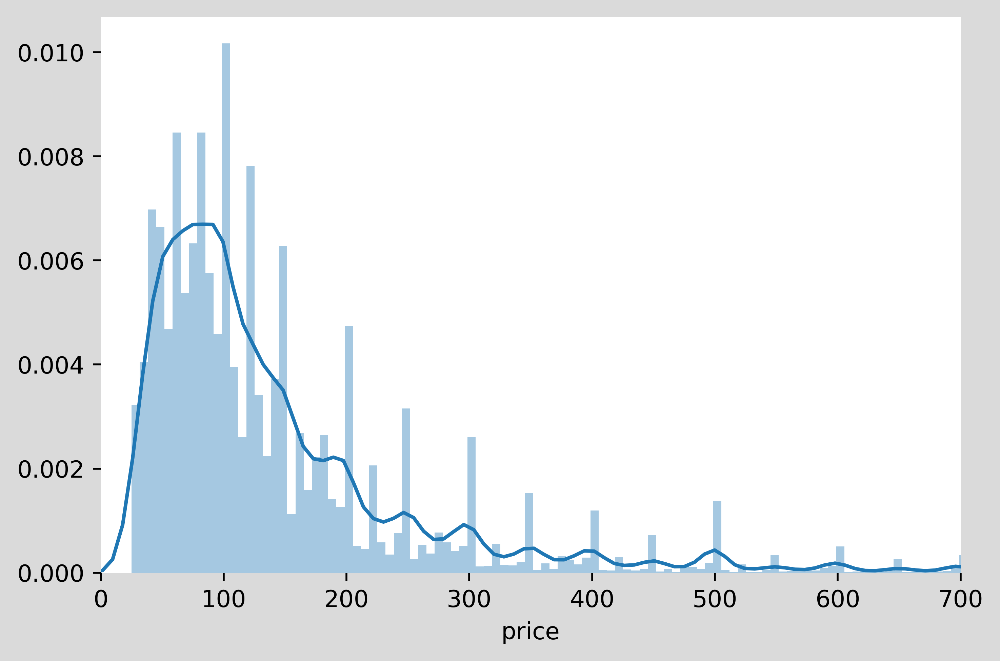

In [ ]:
# Looks much better than before 
def plotting_to_check_skewness():
    for col in ['price']:
        # to set the facecolor
        plt.figure(dpi=500, facecolor = '#dadada')
        # setting the limit on the x axis to be able to visualize as we have a big outliers
        plt.xlim(0, 700)
        
        sns.distplot(airbnb[col], kde=True, bins='auto')
        
        # Remove the splines 
        plt.gca().spines["top"].set_visible(False)
        plt.gca().spines["bottom"].set_visible(False)
        plt.gca().spines["right"].set_visible(False)
        plt.gca().spines["left"].set_visible(False)

        plt.tight_layout() # Makes it better looking specially on laptops

        # to save the fig
        plt.savefig('skew.png',bbox_inches='tight', dpi=500, facecolor = '#dadada')

        plt.show()
        
plotting_to_check_skewness()

In [ ]:
# Resetting the index as we deleted some rows 
airbnb.reset_index(drop=True, inplace=True)

# Feature Engineering

- we could make a new column subtracting 'last_review' from 'host_since'. It will give us an idea of how long the property has been listed. 
- we could make another new column subtracting 'first_review' from 'host_since'. It will give us an idea on how long did the property take to get the first review
- `Zipcode` being a nominal Categorical feature we will `frequency/count` encode it 
- we could extract some important information from amenities using `NLP`. 

How long the property has been listed for 

In [ ]:
# how long the property has been listed for 
airbnb['listed_since_when'] = abs(airbnb['host_since'] - airbnb['last_review'])
airbnb['first_review_after_how_long'] = abs(airbnb['host_since'] - airbnb['first_review'])

# we will go ahead and drop host_since, first_review and last_review
airbnb = airbnb.drop(['host_since', 'first_review', 'last_review'], axis=1)

Finding out the total number of words in each row in the `description` vertical

In [ ]:
# first we could take care of the missing values filling in with the blank space 
airbnb['description'] = airbnb['description'].fillna(' ')
# we will split the sentence and then we count how many words are in each row 
airbnb['description'] = airbnb['description'].str.split().str.len()

airbnb.description.head(5)

0    163
1    145
2    153
3    179
4    158
Name: description, dtype: int64

`Nominal encoding zipcode`

In [ ]:
# There are some values in zip code that has ('-')
airbnb['zipcode'] = airbnb['zipcode'].str.split('-').str[0]
# To decrease the noise i only want the zipcodes that have a value count of over 100 
filt = airbnb['zipcode'].value_counts() > 100
# The values that have value count less than fifty i will put them under Other
airbnb.loc[~airbnb['zipcode'].isin(filt.index), 'zipcode'] = 'Other'

airbnb['zipcode'].nunique()


320

In [ ]:
# Zip code being a nominal categorical feature we can do count/frequency encoding 

# making a dictionary to map it to the zipcode feature
count_map = airbnb['zipcode'].value_counts().to_dict()

airbnb['zipcode'] = airbnb['zipcode'].map(count_map)

In [ ]:
# we have encoded the zipcodes to count and it might help our model
airbnb['zipcode'].head()

0     144
1     168
2    1109
3     335
4      31
Name: zipcode, dtype: int64

plotting a heatmap with the `correlation matrix`

In [ ]:
# lets have a look at our corr matrix and see if can get any insight
airbnb_corr = airbnb.corr()
airbnb_corr.price.sort_values(ascending=False)

price                                          1.000000
bedrooms                                       0.589107
accommodates                                   0.584047
cleaning_fee                                   0.583522
bathrooms                                      0.485059
beds                                           0.468238
guests_included                                0.369225
security_deposit                               0.361890
extra_people                                   0.138050
zipcode                                        0.121819
availability_365                               0.078674
description                                    0.073092
review_scores_location                         0.071224
maximum_nights                                 0.055557
availability_30                                0.054295
availability_60                                0.053169
availability_90                                0.052301
calculated_host_listings_count                 0

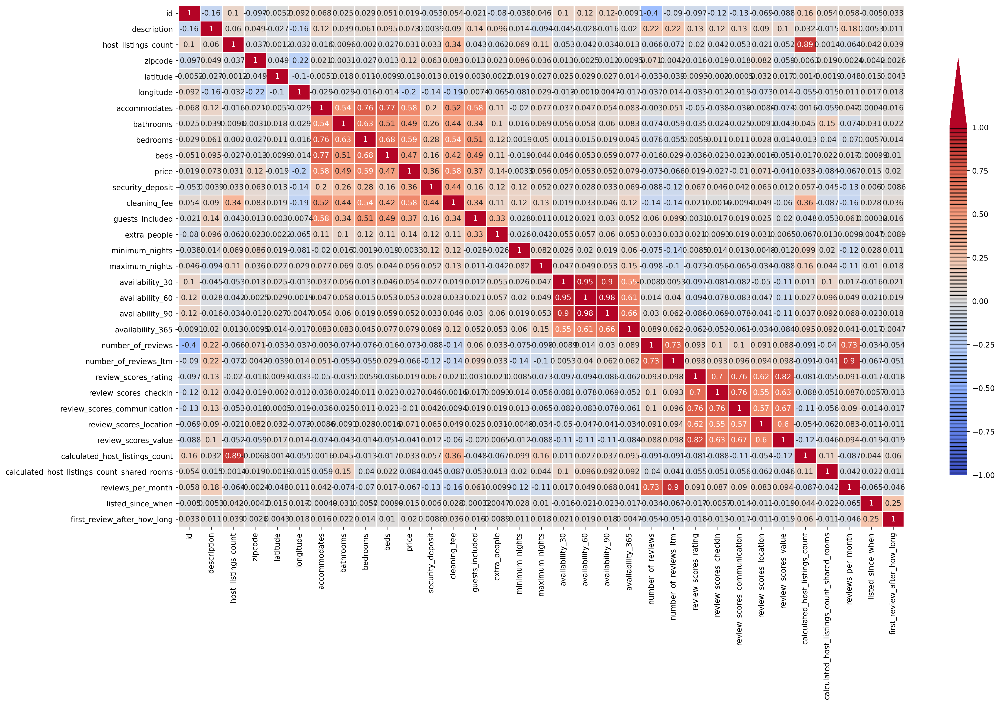

In [ ]:
# set heatmap size
plt.figure(figsize= (22,13), dpi=250) 
# create heatmap using seaborn
cbar_kws = {"shrink":.8,
           'extend':'max',
           'extendfrac':.2, 
           "drawedges":True}

sns.heatmap(airbnb_corr, vmin = -1, vmax = 1, cmap="coolwarm", annot = True, annot_kws={'size': 10}, linewidth = 1, cbar_kws=cbar_kws)

plt.savefig(r'heat.png',bbox_inches='tight', dpi=250, facecolor = '#dadada')

plt.show()


Looking at the heatmap we can eliminate features that highly correlated between each other as they will not add anymore value in the model.
- one of the calculated_host_listing_count or host_listings_count could be deleted as they are highly correalted between eachother. 
- one of the reviews_per_month or number_of_reviews_ltm could be deleted as they are highly correalted between eachother.
- two of the three availability_30, availability_60, availability_90 could also be deleted. 

In [ ]:
drop_cols4 = ['number_of_reviews_ltm', 'availability_60', 'availability_90', 'host_listings_count']

airbnb.drop(drop_cols4, axis=1, inplace=True)

Changing the name of the `neighbourhood_cleansed` vertical

## Extracting information using Natural Language Processing (NLP)

In [ ]:
# Extracting valuable information from amenities

# first step before we feed the input to CountVectorizer is to clean the text 

# Instantiate (I will be using lemmatizer but we could have also used stemmer)
lemmatizer = WordNetLemmatizer()
# empty list which will append after evry loop 
corpus_am = []
# writing a for loop to itterate over every description 
for i in range(len(airbnb)):
    # remove evrerything but wordsa sp starting from a to z
    review = re.sub('[^a-zA-Z]', ' ', airbnb.amenities[i])
    # to change everything to lower case
    review = review.lower()
    # to split the sentence 
    review = review.split()
    # for every word in review, lemmatize the word if it is not in stopwords
    review = [lemmatizer.lemmatize(word) for word in review if word not in set(stopwords.words('english')) ]
    
    review = ' '.join(review)
    # append the words in the empty list created above
    corpus_am.append(review)
    
    

In [ ]:
# # creating the bag of words model 

#passing the list of amenities that i am interested in
vect = CountVectorizer(analyzer='word', ngram_range=(1, 2), vocabulary=['dryer', 'washer', 'wifi', 'air conditioning', 'laptop-friendly workspace',
                                                                      'internet', 'kitchen', 'referigerator', 'hair dryer', 'iron', 'patio or balcony',
                                                                      'heating', 'indoor fireplace', 'free street parking', 'microwave', 'hot water',
                                                                      'cabel tv', 'garden or backyard', 'free parking on premises', 'breakfast', 'essentials',
                                                                      'coffee maker', 'dishes and silverware', 'self check-in', 'dishwasher', 'stove', 'oven',
                                                                      'private entrance', 'gym', 'pool', 'beach essentials', 'extra pillows and blanket'
                                                                      ])

# fit corpus_am
para_dtm = vect.fit(corpus_am)

# examine the fitted vocabulary
vect.get_feature_names()

['dryer',
 'washer',
 'wifi',
 'air conditioning',
 'laptop-friendly workspace',
 'internet',
 'kitchen',
 'referigerator',
 'hair dryer',
 'iron',
 'patio or balcony',
 'heating',
 'indoor fireplace',
 'free street parking',
 'microwave',
 'hot water',
 'cabel tv',
 'garden or backyard',
 'free parking on premises',
 'breakfast',
 'essentials',
 'coffee maker',
 'dishes and silverware',
 'self check-in',
 'dishwasher',
 'stove',
 'oven',
 'private entrance',
 'gym',
 'pool',
 'beach essentials',
 'extra pillows and blanket']

In [ ]:
# now we will transform the corpus_am into a 'document-term matrix'
# since this outputs a sparse matrix, we will convert in into an array so we could use that to make our airbnb dataframe
amenities_dtm = vect.transform(corpus_am).toarray()

In [ ]:
# we will convert this into a dataframe so we could merge with our airbnb dataframe
amenities_dtm = pd.DataFrame(amenities_dtm, columns=vect.get_feature_names())
amenities_dtm

,dryer,washer,wifi,air conditioning,laptop-friendly workspace,internet,kitchen,referigerator,hair dryer,iron,patio or balcony,heating,indoor fireplace,free street parking,microwave,hot water,cabel tv,garden or backyard,free parking on premises,breakfast,essentials,coffee maker,dishes and silverware,self check-in,dishwasher,stove,oven,private entrance,gym,pool,beach essentials,extra pillows and blanket
0,2,1,1,1,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
1,2,1,1,1,0,1,1,0,1,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,1,0,1,0,0
2,2,1,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,0,0,1,0,1,0,0,1,1,1,0,1,0,0,0
3,2,1,1,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,2,1,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34261,2,1,1,1,0,0,1,0,1,1,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0
34262,2,1,1,0,0,0,1,0,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
34263,1,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0
34264,1,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Changing the name of the columns before we merge with our original dataset. Making column names more conventional.

In [ ]:
# replacing " " and '-' with "_" using lambda function
amenities_dtm = amenities_dtm.rename(columns=lambda x: x.replace(" ","_").replace('-','_')) 

amenities_dtm

,dryer,washer,wifi,air_conditioning,laptop_friendly_workspace,internet,kitchen,referigerator,hair_dryer,iron,patio_or_balcony,heating,indoor_fireplace,free_street_parking,microwave,hot_water,cabel_tv,garden_or_backyard,free_parking_on_premises,breakfast,essentials,coffee_maker,dishes_and_silverware,self_check_in,dishwasher,stove,oven,private_entrance,gym,pool,beach_essentials,extra_pillows_and_blanket
0,2,1,1,1,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
1,2,1,1,1,0,1,1,0,1,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,1,0,1,0,0
2,2,1,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,0,0,1,0,1,0,0,1,1,1,0,1,0,0,0
3,2,1,1,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,2,1,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34261,2,1,1,1,0,0,1,0,1,1,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0
34262,2,1,1,0,0,0,1,0,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
34263,1,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0
34264,1,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Merging amenities_dtm and airbnb

In [ ]:
# we are setting left_index and right_index=True to be able to merge two dataframes that have no columns in common
airbnb_final = pd.merge(airbnb, amenities_dtm, left_index=True, right_index=True)
airbnb_final.head()

,id,description,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighborhood,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_365,number_of_reviews,review_scores_rating,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,calculated_host_listings_count,calculated_host_listings_count_shared_rooms,reviews_per_month,listed_since_when,first_review_after_how_long,dryer,washer,wifi,air_conditioning,laptop_friendly_workspace,internet,kitchen,referigerator,hair_dryer,iron,patio_or_balcony,heating,indoor_fireplace,free_street_parking,microwave,hot_water,cabel_tv,garden_or_backyard,free_parking_on_premises,breakfast,essentials,coffee_maker,dishes_and_silverware,self_check_in,dishwasher,stove,oven,private_entrance,gym,pool,beach_essentials,extra_pillows_and_blanket
0,109,163,NaN,NaN,0,f,Other,144,33.98209,-118.38494,Condominium,Entire home/apt,6,2.0,2.0,3.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",122.0,500.0,240.0,3,25.0,30,730,t,0,71,2,80.0,6.0,8.0,10.0,8.0,f,strict_14_with_grace_period,t,1,0,0.02,7.0,7.0,2,1,1,1,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
1,344,145,within a few hours,100,30,f,Other,168,34.16562,-118.33458,House,Entire home/apt,6,1.0,3.0,3.0,Real Bed,"{Internet,Wifi,""Air conditioning"",Pool,Kitchen...",168.0,0.0,100.0,6,0.0,2,14,t,1,128,8,97.0,10.0,10.0,10.0,10.0,t,flexible,f,1,0,0.16,14.0,4.0,2,1,1,1,0,1,1,0,1,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,1,0,1,0,0
2,2708,153,within an hour,100,100,t,Hollywood,1109,34.09768,-118.34602,Apartment,Private room,1,1.5,1.0,1.0,Real Bed,"{Internet,Wifi,""Air conditioning"",""Wheelchair ...",79.0,450.0,89.0,1,0.0,30,366,t,14,349,24,97.0,10.0,10.0,10.0,10.0,t,strict_14_with_grace_period,f,2,0,0.33,26.0,14.0,2,1,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,0,0,1,0,1,0,0,1,1,1,0,1,0,0,0
3,2732,179,within an hour,100,70,f,Santa Monica,335,34.00475,-118.48127,Apartment,Private room,1,1.0,1.0,1.0,Pull-out Sofa,"{Internet,Wifi,Kitchen,Heating,Washer,Dryer,""S...",155.0,NaN,100.0,1,0.0,1,180,t,30,365,21,94.0,9.0,9.0,10.0,9.0,f,strict_14_with_grace_period,f,2,0,0.19,14.0,15.0,2,1,1,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,2864,158,within a few hours,100,NaN,f,Other,31,33.87619,-118.11397,Apartment,Entire home/apt,2,1.0,1.0,1.0,Real Bed,"{TV,Internet,Wifi,""Air conditioning"",""Free par...",80.0,100.0,75.0,2,0.0,30,730,t,0,0,0,NaN,NaN,NaN,NaN,NaN,t,strict_14_with_grace_period,f,1,0,NaN,NaN,NaN,2,1,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# we will delete the amenities
airbnb_final = airbnb_final.drop(['amenities'], axis=1)
airbnb_final.shape

(34266, 73)

# Split dataset 

making a test set and putting it aside. `NO SNOOPING!`

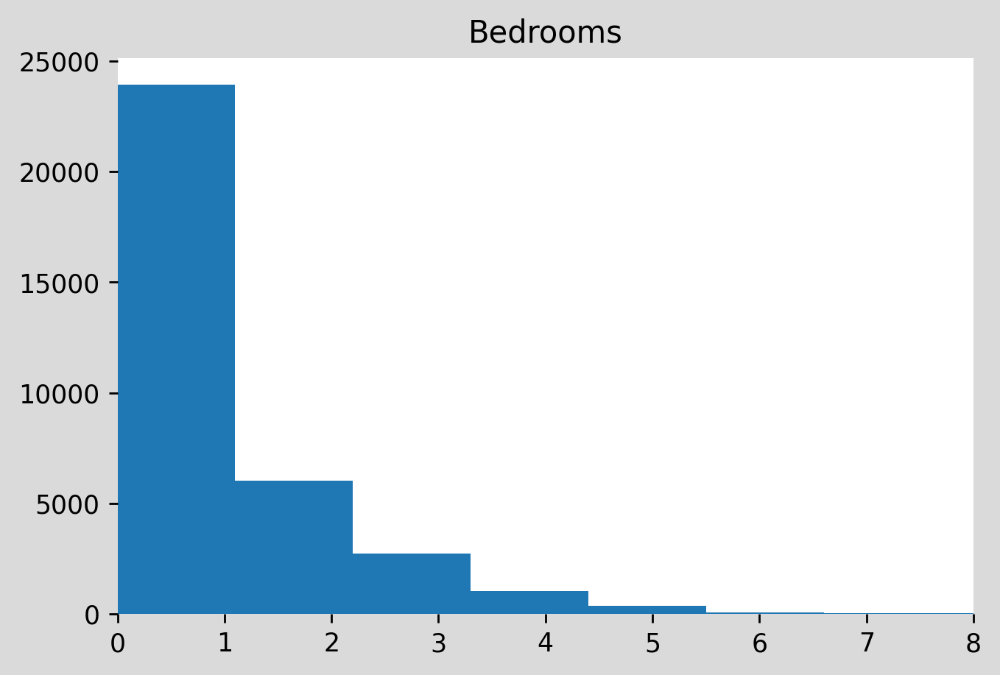

In [ ]:
plt.figure(dpi=250, facecolor = '#dadada')
# histogram of the bedrooms attribute
plt.hist(airbnb['bedrooms'])

plt.xlim(0,8)

# Remove the splines 
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["bottom"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_visible(False)

plt.title('Bedrooms')
plt.savefig(r"box5.png")

plt.show()

Looking at the correlation matrix above, we know bedrooms is highly important in predicting the nightly price of an airbnb in LA. We would want to split the data makeing sure the test set is representative of the various categories of number of bedrooms in the whole dataset.

Most number of bedrooms in the property are between 1-3 but some properties have bedrooms which are way more than 3. It is important to have sufficient number of instances in the dataset from each stratum, or else estimate of the stratum's importance may be biased.

I will be making a new column that will split into bins, making sure it does not have too many strata and each stratum is large enough. After we have the new column we are all set to do stratified sampling using StratifiedShuffleSplit class from Scikit-Learn.

In [ ]:
# Filling the NaN values using front fill method
airbnb_final['bedrooms'] = airbnb_final['bedrooms'].fillna(method='ffill')

# Made a new column with 4 bins each with good amount of instances  
airbnb_final['bedroom'] = pd.cut(airbnb_final['bedrooms'],
                               bins=[0., 1, 2, np.inf],
                               labels=[1, 2, 3])


airbnb_final['bedroom'] = airbnb_final['bedroom'].fillna(method='ffill')

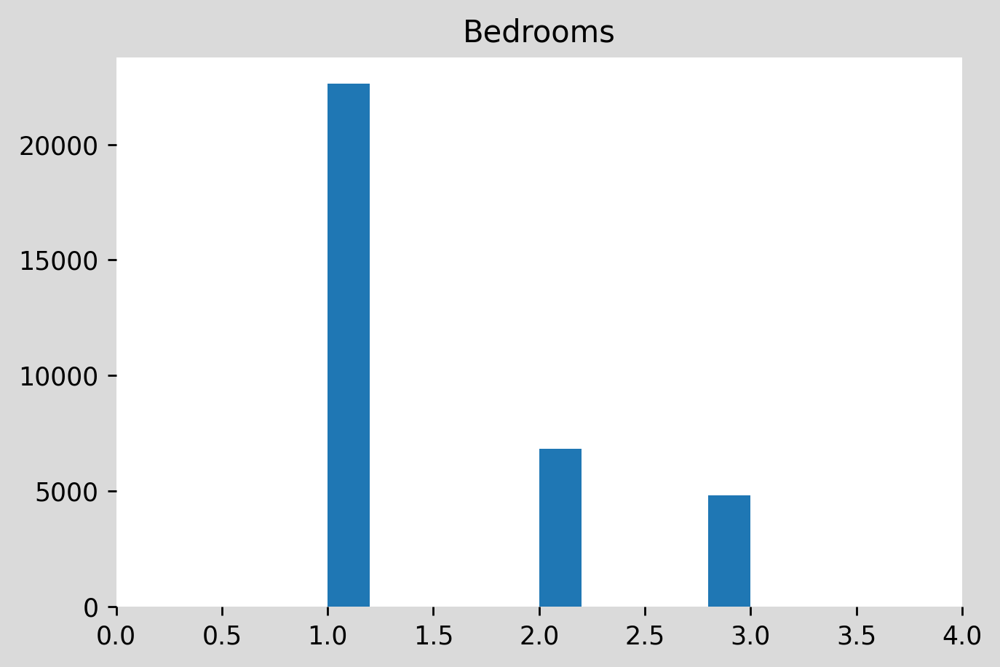

In [ ]:
# histogram plot of our newly created column

plt.figure(dpi=250, facecolor = '#dadada')
# histogram of the bedrooms attribute
plt.hist(airbnb_final['bedroom'])

plt.xlim(0,4)

# Remove the splines 
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["bottom"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_visible(False)

plt.savefig(r"box7.png")

plt.title('Bedrooms')
plt.show()

In [ ]:
# using Stratified Sampling from Scikit Learn
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in split.split(airbnb_final, airbnb_final["bedroom"]):
# our stratified train and test set 
    strat_train_set = airbnb_final.loc[train_index]
    strat_test_set = airbnb_final.loc[test_index]

In [ ]:
# dropping our new column that we just made for the purpose of stratified splitting
for set in (strat_train_set, strat_test_set):
    set.drop(['bedroom'], axis=1, inplace=True)

## Feature Matrix and Target Vector

In [ ]:
# Feature matrix
X_train = strat_train_set.drop('price', axis=1)
# Target Variable
y_train = strat_train_set['price']

# Baseline model 

For **evaluation metrics** i will be using `Mean Absolute Error` as it is not affected by outliers unlike Mean Squared Error. 

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

print('Baseline MAE:', mean_absolute_error(y_train, [y_train.mean()]*len(y_train)))

Baseline MAE: 93.50232399090115


# Pipeline 

Notes: we will be using the following the in the initial pipeline

- We will be using `simple imputer` with `median` for `numerical attributes` as there are outliers

-  We will be using `simple imputer` with `'most_frequent'` for `categorical attributes`

- We will be using `One Hot encoder` for encoding all categorical attributes but 'host_response_rate', 'host_acceptance_rate'

- we will be using `Ordinal encoding` for 'host_response_rate', 'host_acceptance_rate' attributes

- we will be using `standard scaler` as `linear models` and `Support Vector Machines` work better with scaled values 

- I will be splitting pipelines into numerical and categorical as i will be using different strategy as mentioned above for each 

In [ ]:
# lets look at numerical attributes for simple imputer with median 
num_attribs = X_train.select_dtypes(exclude='object')
num_attribs.columns

Index(['id', 'description', 'zipcode', 'latitude', 'longitude', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'security_deposit', 'cleaning_fee',
       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',
       'availability_30', 'availability_365', 'number_of_reviews',
       'review_scores_rating', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'calculated_host_listings_count',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month',
       'listed_since_when', 'first_review_after_how_long', 'dryer', 'washer',
       'wifi', 'air_conditioning', 'laptop_friendly_workspace', 'internet',
       'kitchen', 'referigerator', 'hair_dryer', 'iron', 'patio_or_balcony',
       'heating', 'indoor_fireplace', 'free_street_parking', 'microwave',
       'hot_water', 'cabel_tv', 'garden_or_backyard',
       'free_parking_on_premises', 'breakfast', 'essentials', 'coffee_maker',
   

In [ ]:
# lets look at categorical attributes for simple imputer with 'most_frequent'
cat_attribs = X_train.select_dtypes(include='object')
cat_attribs.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'neighborhood', 'property_type', 'room_type',
       'bed_type', 'has_availability', 'instant_bookable',
       'cancellation_policy', 'require_guest_profile_picture'],
      dtype='object')

In [ ]:
# making a seperate list for cols that we will one hot encode and the other taht we will ordinal encode
cat_attribs_ohe = cat_attribs.drop(['host_response_rate', 'host_acceptance_rate'], axis=1)

cat_attribs_ordinal = cat_attribs[['host_response_rate', 'host_acceptance_rate']]
cat_attribs_ordinal.columns

Index(['host_response_rate', 'host_acceptance_rate'], dtype='object')

In [ ]:
cat_attribs_ohe.columns

Index(['host_response_time', 'host_is_superhost', 'neighborhood',
       'property_type', 'room_type', 'bed_type', 'has_availability',
       'instant_bookable', 'cancellation_policy',
       'require_guest_profile_picture'],
      dtype='object')

Making a `Custom Transformer for Imputing categorical NaN`, which will `output` the result as a `dataframe`; which we will later pass it on to encoder in the pipeline. I have having an issue of simple imputer spitting out an array, which when passed to ohe for encoding the cat features was throwing an error, as it was expecting a dataframe. 

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

class ImputerDF(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.imputer = SimpleImputer(strategy='most_frequent')
        self.cols = []
        
    def fit(self, X, y=None):
        self.imputer.fit(X)
        self.cols = list(X.columns)
        return self
    
    def transform(self, X):
        X_t = self.imputer.transform(X)
        return pd.DataFrame(X_t, columns=self.cols)

In [ ]:
# making sure it works fine and outputs a dataframe before we apply it in the pipeline.
idf = ImputerDF()
idf.fit_transform(X_train.iloc[:5])

,id,description,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighborhood,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_365,number_of_reviews,review_scores_rating,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,calculated_host_listings_count,calculated_host_listings_count_shared_rooms,reviews_per_month,listed_since_when,first_review_after_how_long,dryer,washer,wifi,air_conditioning,laptop_friendly_workspace,internet,kitchen,referigerator,hair_dryer,iron,patio_or_balcony,heating,indoor_fireplace,free_street_parking,microwave,hot_water,cabel_tv,garden_or_backyard,free_parking_on_premises,breakfast,essentials,coffee_maker,dishes_and_silverware,self_check_in,dishwasher,stove,oven,private_entrance,gym,pool,beach_essentials,extra_pillows_and_blanket
0,34825643,197,within an hour,100,41,f,Other,458,34.0639,-118.362,Apartment,Private room,1,1,1,1,Real Bed,0,10,1,0,6,1125,t,0,0,1,80,10,10,10,8,f,flexible,f,1,0,0.09,20,20,2,1,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,18935122,166,within an hour,100,95,f,Other,544,33.9915,-117.918,Apartment,Entire home/apt,4,1.5,1,2,Real Bed,0,70,1,5,1,1125,t,24,359,11,93,9,9,10,9,f,strict_14_with_grace_period,f,2,0,0.3,0,6,2,1,1,1,0,1,1,0,1,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,1,1,1,0,0
2,22496336,7,within an hour,83,41,f,Other,174,34.0968,-118.136,Other,Shared room,2,1,1,1,Real Bed,0,10,1,0,1,1,t,0,0,2,90,10,10,10,10,f,flexible,f,4,1,0.07,19,19,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,43549860,167,within an hour,96,89,f,Beverly Hills,163,34.0665,-118.383,Townhouse,Entire home/apt,4,1.5,2,2,Real Bed,1000,300,1,0,31,365,t,0,217,0,80,10,10,10,10,f,strict_14_with_grace_period,f,46,0,0.07,0,6,2,1,1,1,0,0,1,0,1,1,0,1,1,0,1,1,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0
4,19834575,176,within a few hours,100,98,t,Other,136,33.9184,-118.409,House,Private room,2,1,1,1,Real Bed,200,100,2,50,2,60,t,24,173,89,99,10,10,10,10,t,strict_14_with_grace_period,f,2,0,2.59,5,27,2,1,1,1,0,0,1,0,1,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0


In [ ]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
from category_encoders import OrdinalEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

# Using median as the strategy for Simple Imputer to predict NaN values considering the ouliers in the data
num_pipeline = make_pipeline(
                            SimpleImputer(strategy='median'),
                            StandardScaler()
)
# Adding the Custom Transformer to impute using 'most_frequent' as the strategy 
# Also, giving out an output as a dataframe instead of an array
cat_pipeline = make_pipeline(
                            ImputerDF(),
                            OrdinalEncoder(cols = cat_attribs_ordinal),
                            OneHotEncoder(cols = cat_attribs_ohe)
)

Using `Column transformer` we will be putting two pipelines together 

In [ ]:
# generating a list of categorical and numerical columns to pass it in the column transformer
cat_attributes = list(cat_attribs)
num_attributes = list(num_attribs)

pipeline = ColumnTransformer([
                            ('num_pipeline', num_pipeline, num_attributes),
                            ('cat_attribs', cat_pipeline, cat_attributes)
])

# we will fit and transform on X_train
X_train_transformed = pipeline.fit_transform(X_train)


# Model Selection 

Notes: 

- `Linear regression:`

I will be trying elastic net as we have a lot of columns, and elastic net being the combination of ridge and lasso which we can control with a parameter, should work perfectly for this model.

- `Ensemble Models:`

Random forest Regressor

Gradiant Boosting Regressor

Voting Regressor

- `Support Vector Machines Regressor` 

## Linear Regression

We have a well generalized model and it doesn't need any tuning. 

`We will drop our idea of using elastic net as our linear model does not need any regularization.` 

In [ ]:
from sklearn.linear_model import LinearRegression

# Instantiate
lin_reg = LinearRegression()
# taking a log of our target variable as it had a positive skew of 4+
y_train_log = np.log1p(y_train)
# fit
lin_reg.fit(X_train_transformed, y_train_log)
# predicting the train set
y_pred_log_train = lin_reg.predict(X_train_transformed)
# we will take explonential to reverse it so we could use it for predictions 
y_pred_train = np.expm1(y_pred_log_train)


In [ ]:
print('Mean Absolute Error on Training Set:', mean_absolute_error(y_train, y_pred_train))

Mean Absolute Error on Training Set: 49.57434123325922


In [ ]:
lin_reg_scores = (-cross_val_score(lin_reg, X_train_transformed, y_train,cv=10, scoring='neg_mean_absolute_error'))
lin_reg_scores.mean()

56.54983328929469

## Ensemble models

###  Random Forest Regressor 
model is `overfitting` and has `high variance`.

We will perform cross validation looking for the best combination of the values of hyperparameters that will help generalize the model. 

In [ ]:
from sklearn.ensemble import RandomForestRegressor 
# Istantiate
forest_reg = RandomForestRegressor(n_jobs=-1) 
# Fit
forest_reg.fit(X_train_transformed, y_train)
# predict on the train set
y_pred_train = forest_reg.predict(X_train_transformed)


In [ ]:
print('Mean Absolute Error on Training Set:', mean_absolute_error(y_train, y_pred_train))

Mean Absolute Error on Training Set: 16.28175860936816


In [ ]:
forest_reg_scores = (-cross_val_score(forest_reg, X_train_transformed, y_train,cv=10, scoring='neg_mean_absolute_error'))
forest_reg_scores.mean()

43.94587147391197

### Gradiant Boosting Regressor -

- Subsample might help us with overfitting. It is the fraction of samples to be used for fitting the individual base learners. If smaller than 1.0 this results in Stochastic Gradient Boosting. subsample interacts with the parameter n_estimators. Choosing subsample < 1.0 leads to a reduction of variance and an increase in bias.
- `It does not have n_jobs` as the `predictors run in sequence`, and not in parallel like bagging. 

Gradiant Boosting is the most `promising generalized model` so far, and we don't see any need of hypertuning using cross validation.

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

#instantiate
gbrt = GradientBoostingRegressor()

gbrt.fit(X_train_transformed, y_train)

# train set
y_pred_train = gbrt.predict(X_train_transformed)


In [ ]:
print('Mean Absolute Error on Training Set:', mean_absolute_error(y_train, y_pred_train))

Mean Absolute Error on Training Set: 45.316713658966414


In [ ]:
gbrt_scores = (-cross_val_score(gbrt, X_train_transformed, y_train,cv=10, scoring='neg_mean_absolute_error'))
gbrt_scores.mean()

46.54599636403316

## Support Vector Machine regressor

Support Vector Machine is a `good generalized model` as well, but it does not beat our Gradient Boosting Regressor. 

In [ ]:
from sklearn.svm import LinearSVR

svr = LinearSVR(max_iter=10000)

svr.fit(X_train_transformed, y_train)
#predicting on the train set
y_pred_train = svr.predict(X_train_transformed)


In [ ]:
print('Mean Absolute Error on Training Set:', mean_absolute_error(y_train, y_pred_train))

Mean Absolute Error on Training Set: 52.10724271963167


In [ ]:
svr_scores = (-cross_val_score(svr, X_train_transformed, y_train,cv=10, scoring='neg_mean_absolute_error'))
svr_scores.mean()

52.32176697963231

### Voting regressor

Since we have three good `diverse models (linear Regression, Support Vector Machines, Gradient Boosting Regressor)`, we could `put them together` in a Voting Regressor and hopefully will beat all other models. 

In [ ]:
from sklearn.ensemble import VotingRegressor

vr = VotingRegressor(estimators=[
                                ('lr', LinearRegression()), 
                                ('gbrt', GradientBoostingRegressor()), 
                                ('lsvr', LinearSVR())], 
                                n_jobs=-1)

vr.fit(X_train_transformed, y_train)

#predicting on the train set
y_pred_train = vr.predict(X_train_transformed)


In [ ]:
print('Mean Absolute Error on Training Set:', mean_absolute_error(y_train, y_pred_train))

Mean Absolute Error on Training Set: 48.7583273477994


In [ ]:
vr_reg_scores = (-cross_val_score(vr, X_train_transformed, y_train,cv=10, scoring='neg_mean_absolute_error'))
vr_reg_scores.mean()

49.258706448713475

## Hyper Tuning our best model 

Top 2 picks: 

**Random Forest Regressor** has `high variance`, but also has the `lowest Mean Absolute Error on the Validation set`. We will try hypertuning its parameters and see if we can get a more generalized model. 

Out of all the models that i have tried, **Gradiant Boosting regressor** seems to work the best and there is no further need to hypertune the model as `it is a perfect generalized model as it is.`

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform
# Parameters
n_estimators = randint(60, 105)
max_features = uniform(0, 1)
max_depth = [8,11,12,13]
# Istantiate
forest_rig_model = RandomForestRegressor(random_state=42)
# making a dictionary with a list of values of possible parameters
param_dist = dict(n_estimators=n_estimators, max_features=max_features, max_depth=max_depth)
# n_iter controls the number of searches 

rand = RandomizedSearchCV(forest_rig_model, # our model that we used 
                          param_dist, # dictionary containing the list possible paramaters
                          cv=4, # number of cross validation folds 
                          scoring='neg_mean_absolute_error', 
                          n_iter=7, # Number of itterations
                          random_state=42, 
                          verbose=10, 
                          n_jobs=-1) # use all the available cores
# fit the model
rand.fit(X_train_transformed, y_train)

Fitting 4 folds for each of 7 candidates, totalling 28 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  24 out of  28 | elapsed:  4.4min remaining:   43.7s
[Parallel(n_jobs=-1)]: Done  28 out of  28 | elapsed:  4.6min finished


RandomizedSearchCV(cv=4, estimator=RandomForestRegressor(random_state=42),
                   n_iter=7, n_jobs=-1,
                   param_distributions={'max_depth': [8, 11, 12, 13],
                                        'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x14f74fe50>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x14f74ff10>},
                   random_state=42, scoring='neg_mean_absolute_error',
                   verbose=10)

In [ ]:
print(-rand.best_score_) # Gives the score that we specified in the model
print(rand.best_params_) # gives the best possible combination of parameters that we passed in the dictionary
print(rand.best_estimator_) # It contains best values values of all the parameters

45.83028923924184
{'max_depth': 13, 'max_features': 0.7080725777960455, 'n_estimators': 81}
RandomForestRegressor(max_depth=13, max_features=0.7080725777960455,
                      n_estimators=81, random_state=42)


In [ ]:
# Istantiate 
forest = rand.best_estimator_
# fit
forest.fit(X_train_transformed, y_train)
# predict on X_train
y_pred_train = forest.predict(X_train_transformed)

In [ ]:
print('Mean Absolute Error on Training Set:', mean_absolute_error(y_train, y_pred_train))

Mean Absolute Error on Training Set: 33.16861214699876


In [ ]:
# STill high Variance 
forest_scores = (-cross_val_score(
                        forest, 
                        X_train_transformed, y_train,
                        cv=10, scoring='neg_mean_absolute_error'))
forest_scores.mean()

45.43194750503683

# Final Pick 

It's a tough pick between the gradient boosting regressor and Random Forest Regressor. 

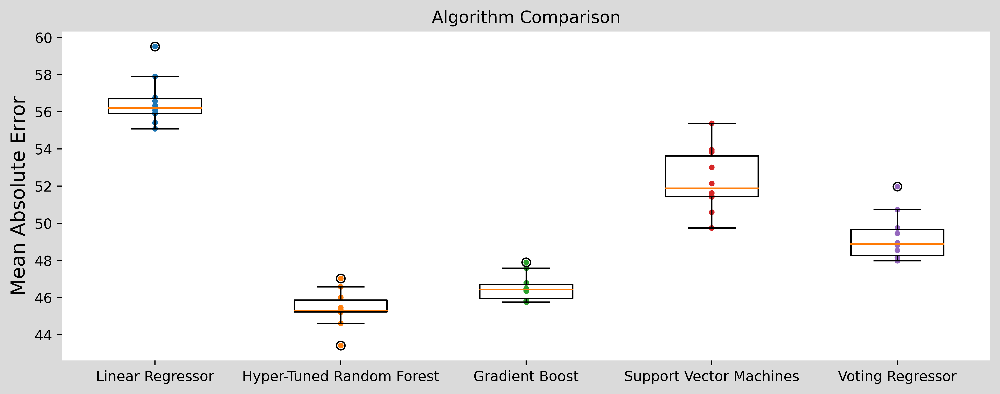

In [ ]:

fig = plt.figure(figsize=(10, 4), facecolor= '#dadada', dpi=500)

plt.plot([1]*10, lin_reg_scores, ".")
plt.plot([2]*10, forest_scores, ".")
plt.plot([3]*10, gbrt_scores, ".")
plt.plot([4]*10, svr_scores, ".")
plt.plot([5]*10, vr_reg_scores, ".")

plt.boxplot([lin_reg_scores, forest_scores, gbrt_scores, svr_scores, vr_reg_scores], 
            labels=("Linear Regressor","Hyper-Tuned Random Forest", 'Gradient Boost', 'Support Vector Machines', 'Voting Regressor'))

plt.ylabel("Mean Absolute Error", fontsize=14)
plt.title('Algorithm Comparison')


# Remove the splines 
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["bottom"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_visible(False)

plt.tight_layout() # Makes it better looking specially on laptops

# to save the fig
fig.savefig('algcomparison.png',bbox_inches='tight', dpi=500, facecolor = '#dadada')

plt.show()

# Permutation 

Feature importances means or Feature importances Standard Deviation that we generate using the permutation class is in the format of numpy array. Those numbers would only make any sense if we can generate a list of columns and zip it to the feature importances(type:numpy.array) or maybe make a dataframe out of it.

This could be a problem as X_train_transformed and X_val_transformed are also numpy arrays, which means we will not be able to extract columns out of them. Luckily, we have a solution to this problem. If we fit_transform the X_train again using our cat_pipeline which has `One hot Encoder and Ordinal Encoder from the category encoders library as it generates dataframes as an output, unlike scikit learn's preprocessing library.` 

In [ ]:
# This will give us a dataframe from where we will extract the columns
transformed_dataset = cat_pipeline.fit_transform(X_train)
# This will give us all the features 
features = transformed_dataset.columns

In [ ]:
# Instantiate
pi = permutation_importance(forest, X_train_transformed, y_train, n_jobs=-1)

In [ ]:
# The values permutation importances outputs
pi.keys()

dict_keys(['importances_mean', 'importances_std', 'importances'])

In [ ]:
# making a dataframe 
data = {'importances_mean': np.round(pi['importances_mean'], 4),
        'importances_std': pi['importances_std']}

pi_df = pd.DataFrame(data, index=features).sort_values(by='importances_mean', ascending=False)
                              
pi_df.head(10)

,importances_mean,importances_std
host_acceptance_rate,0.2139,0.002492
host_response_rate,0.1618,0.002233
neighborhood_1,0.1572,0.002177
host_response_time_3,0.1160,0.002249
host_response_time_4,0.0897,0.001248
indoor_fireplace,0.0739,0.002640
neighborhood_4,0.0404,0.000809
host_response_time_2,0.0379,0.001083
host_response_time_1,0.0336,0.000457
host_is_superhost_2,0.0281,0.000274


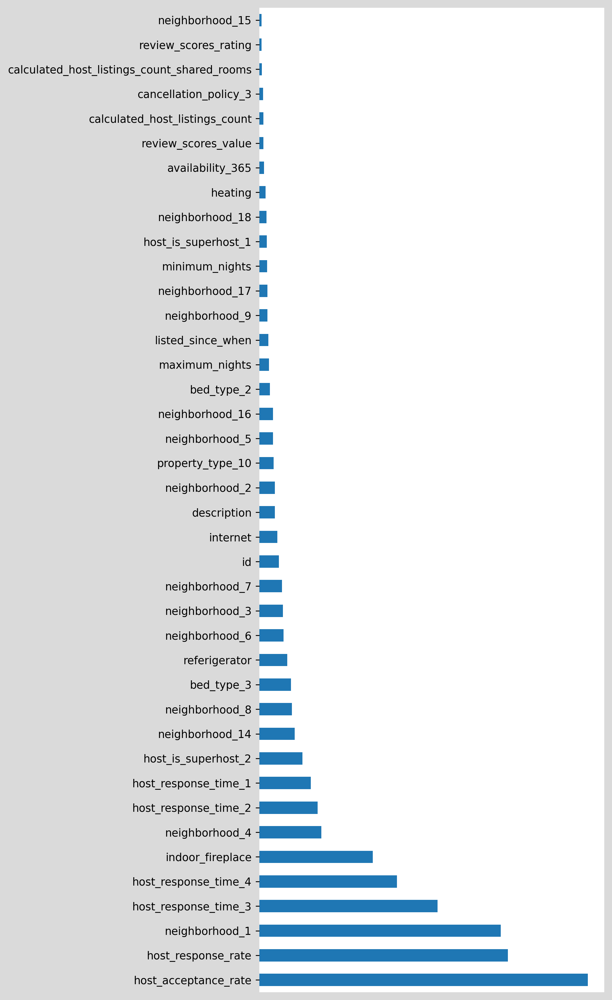

In [ ]:
fig = plt.figure(figsize=(8, 13), facecolor= '#dadada', dpi=250)
# plotting first 40 important features
pi_df['importances_mean'].head(40).plot(kind='barh')

plt.xticks([])
# Remove the splines 
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["bottom"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_visible(False)

plt.tight_layout() # Makes it better looking specially on laptops

# to save the fig
fig.savefig('timeseriesplot.jpg',bbox_inches='tight', dpi=250, facecolor = '#dadada')

plt.show()

`Eli5` is another library that we could use to extract permutation importances along with their weightage. 

In [ ]:
# we will need a list of columns for feature_names 
feature_names = list(features)

In [ ]:
fig = plt.figure(figsize=(4, 8), dpi=500)
# Istantiate
permuter = PermutationImportance(forest, scoring='neg_mean_absolute_error', n_iter=5, cv='prefit')
# fit the model
permuter.fit(X_train_transformed, y_train)
# generates a table with the feature names and the weightage 
eli5.show_weights(permuter, top=None, feature_names=feature_names)

plt.tight_layout() # Makes it better looking specially on laptops

# to save the fig
plt.savefig('eli5.png',bbox_inches='tight', dpi=500)

plt.show()

<Figure size 2000x4000 with 0 Axes>

# Evaluating our model on Test set 

Splitting the test set ito a `feature matrix` and a `target vector` 

In [ ]:
X_test = strat_test_set.drop('price', axis=1)
y_test = strat_test_set['price']

In [ ]:
# Using the Forest Regressor model 
# transform the test set 
X_test_transformed = pipeline.transform(X_test)

# predict on X_test using gbrt
y_pred_test = forest.predict(X_test_transformed)

In [ ]:
print('Mean Absolute Error on Test Set:', 
      mean_absolute_error(y_test, y_pred_test))

Mean Absolute Error on Test Set: 44.610910466056694


  # Making a pipeline for deployment

Using the pipeline we created above and adding Random Forest Regressor as a predictor with the best parameters we found using cross validation. We will then fit that pipeline and then pickle the pipeline.

In [ ]:
X_train.isna().sum().sort_values(ascending=False).head(10)

host_response_time             8462
host_response_rate             8462
security_deposit               6538
review_scores_value            5733
review_scores_location         5730
review_scores_checkin          5729
review_scores_communication    5719
review_scores_rating           5678
listed_since_when              5412
first_review_after_how_long    5412
dtype: int64

In [ ]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
# making a new final pipeline with hard encoded hyper parameters 
final_pipeline = make_pipeline(
                    pipeline,
                    RandomForestRegressor(random_state=42,
                                         n_jobs=-1,
                                         max_features= 0.7080725777960455,
                                         max_depth= 13,
                                        n_estimators= 81)
)

# Fitting the pipeline 
final_pipeline.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num_pipeline',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['id', 'description',
                                                   'zipcode', 'latitude',
                                                   'longitude', 'accommodates',
                                                   'bathrooms', 'bedrooms',
                                                   'beds', 'security_deposit',
                                                   'cleaning_fee',
                                                   'guests_included',
                   

`Pickle` the pipeline

In [ ]:
dump(final_pipeline, 'pipeline.joblib', compress=True)

['pipeline.joblib']

Get version number of every package we used in the pipeline so we could then install all those packages in the Pipenv Shell

In [ ]:
print(f'joblib=={joblib.__version__}')
print(f'scikit-learn=={sklearn.__version__}')
print(f'category_encoders=={ce.__version__}')

joblib==0.14.0
scikit-learn==0.23.2
category_encoders==2.2.2


# Plots to describe our model 

## Partial Dependence Plot (pdp)

### One feature Isolation plots 

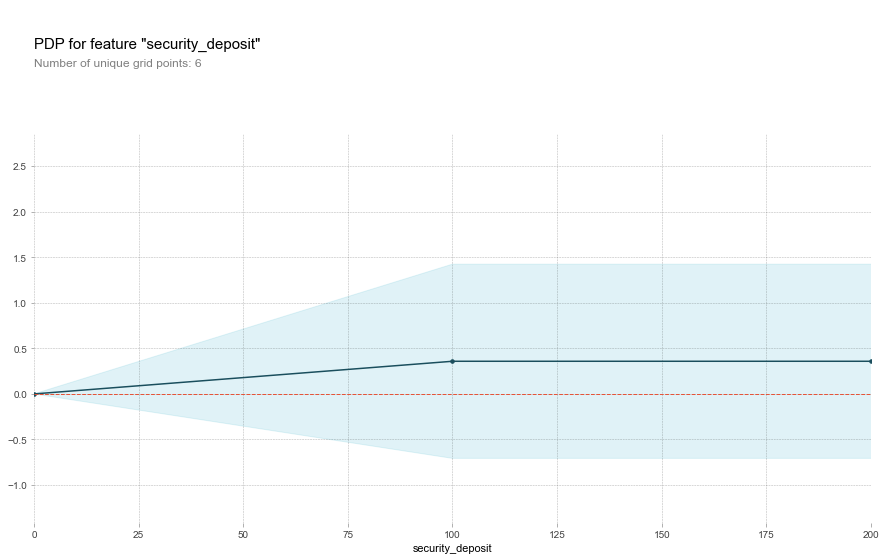

In [ ]:
# fig = plt.figure(figsize=(12, 8), dpi=500)

# how does the security_deposit affect the price of an airbnb
feature_pdp ='security_deposit'

pdp_isolated = pdp_isolate(
                            model=forest, # model that we picked 
                            dataset=transformed_dataset, # dataset we created earlier using the cat_pipeline
                            model_features=features, # list of features our model is using 
                            feature=feature_pdp # features we are comparing 
)

pdp_plot(pdp_isolated, feature_name=feature_pdp);
# pdp_plot(pdp_isolated, feature_name=feature_pdp, plot_lines=True, frac_to_plot=0.1);
# limit the x axis to better visualize the plot 
plt.xlim(0,200);



# saving the pciture
plt.savefig('security_deposit.png',bbox_inches='tight', dpi=500, facecolor = '#dadada')

plt.show()

It's clear from the plot that increase in security deposit does increase the nighlty price of an airbnb until it reaches the 100 mark. From there on onwards it does not affect the price.

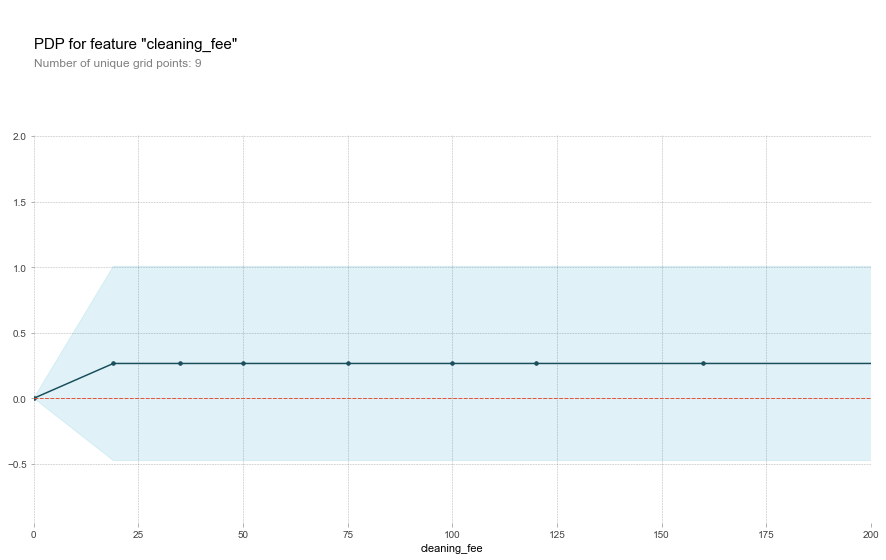

In [ ]:
# how does the security_deposit affect the price of an airbnb
feature_pdp ='cleaning_fee'

pdp_isolated = pdp_isolate(
                            model=forest, # model that we picked 
                            dataset=transformed_dataset, # dataset we created earlier using the cat_pipeline
                            model_features=features, # list of features our model is using 
                            feature=feature_pdp # features we are comparing 
)

pdp_plot(pdp_isolated, feature_name=feature_pdp);
# pdp_plot(pdp_isolated, feature_name=feature_pdp, plot_lines=True, frac_to_plot=0.1);
# limit the x axis to better visualize the plot 

plt.xlim(0,200);
# saving the pciture
plt.savefig('cleaning_fee.png',bbox_inches='tight', dpi=500)

plt.show()

### Partial Dependence Plot, 2 features interaction

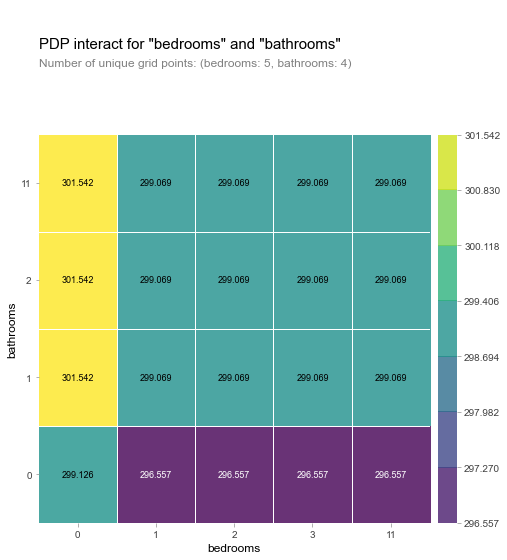

In [ ]:
# fig = plt.figure(dpi=500)
# how does number of bedrooms and bathrooms affect the nightlty price of an airbnb
features_pdp = ['bedrooms', 'bathrooms']

interaction = pdp_interact(
    model=forest, # model that we picked 
    dataset=transformed_dataset, # dataset we created earlier using the cat_pipeline
    model_features=features, # list of features our model is using 
    features=features_pdp # features we are comparing 
)

pdp_interact_plot(interaction, plot_type='grid', feature_names=features_pdp)

# saving the pciture
plt.savefig('pdp1.png',bbox_inches='tight', dpi=500)

plt.show()


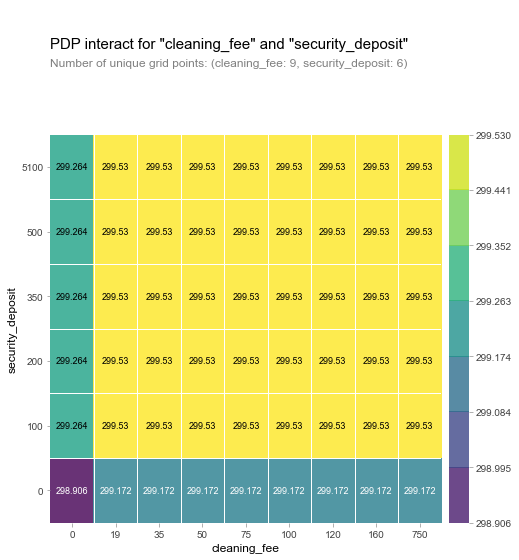

In [ ]:
# fig = plt.figure(dpi=500)
# how does number of bedrooms and bathrooms affect the nightlty price of an airbnb
features_pdp = ['cleaning_fee', 'security_deposit']

interaction = pdp_interact(
    model=forest, # model that we picked 
    dataset=transformed_dataset, # dataset we created earlier using the cat_pipeline
    model_features=features, # list of features our model is using 
    features=features_pdp # features we are comparing 
)

pdp_interact_plot(interaction, plot_type='grid', feature_names=features_pdp)

# saving the pciture
plt.savefig('pdp2.png',bbox_inches='tight', dpi=500)

plt.show()

# Plotly

In [ ]:

fig = px.scatter(airbnb, x='longitude', y='latitude',
                 color='price') # Added color to previous basic 
fig.update_layout(xaxis_title="longitude",yaxis_title="latitude")
fig.show()

In [ ]:
fig = px.scatter(airbnb, x='longitude', y='latitude',
                 color='property_type') # Added color to previous basic 
fig.update_layout(xaxis_title="longitude",yaxis_title="latitude")
fig.show()

In [ ]:
fig = px.scatter(airbnb, x='longitude', y='latitude',
                 color='neighborhood') # Added color to previous basic 
fig.update_layout(xaxis_title="longitude",yaxis_title="latitude")
fig.show()

# Word Cloud 

<Figure size 720x432 with 0 Axes>

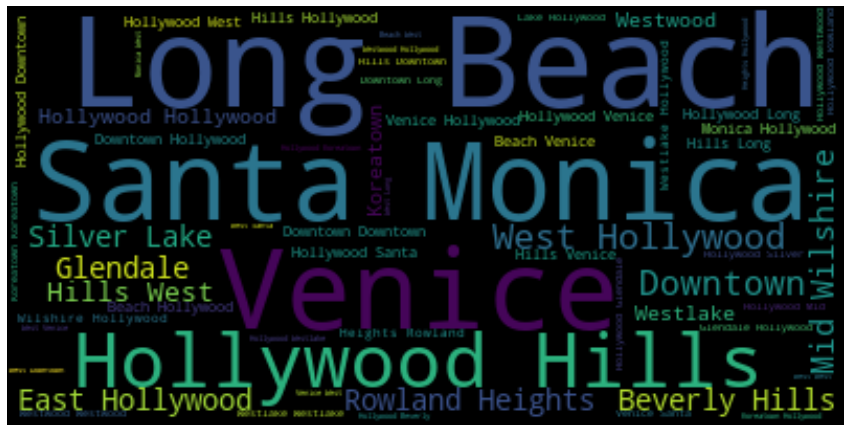

In [ ]:

text = " ".join(str(each) for each in airbnb_final.neighborhood)
# Create and generate a word cloud image:
wordcloud = WordCloud(max_words=100, background_color="black").generate(text)

plt.figure(figsize=(10,6))
plt.figure(figsize=(15,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')

plt.axis("off")

plt.show()